# Torchcam

In [1]:
from torchvision.models import get_model, get_model_weights
from torchcam.methods import LayerCAM

# Define your model
# model = get_model("resnet18", weights=get_model_weights("resnet18").DEFAULT).eval()
model = get_model("vgg16", weights=get_model_weights("vgg16").DEFAULT).eval()
# Set your CAM extractor
cam_extractor = LayerCAM(model, target_layer='features')

In [25]:
print(model)

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

In [2]:
from torchvision.io import decode_image
from torchvision.models import get_model, get_model_weights
from torchcam.methods import LayerCAM

# Get a model and an image
weights = get_model_weights("vgg16").DEFAULT
model = get_model("vgg16", weights=weights).eval()
preprocess = weights.transforms()
img = decode_image("data/cat.jpg")


input_tensor = preprocess(img)

with LayerCAM(model,  target_layer='features.24') as cam_extractor:
  out = model(input_tensor.unsqueeze(0))
  # Retrieve the CAM by passing the class index and the model output
  activation_map = cam_extractor(out.squeeze(0).argmax().item(), out)
 


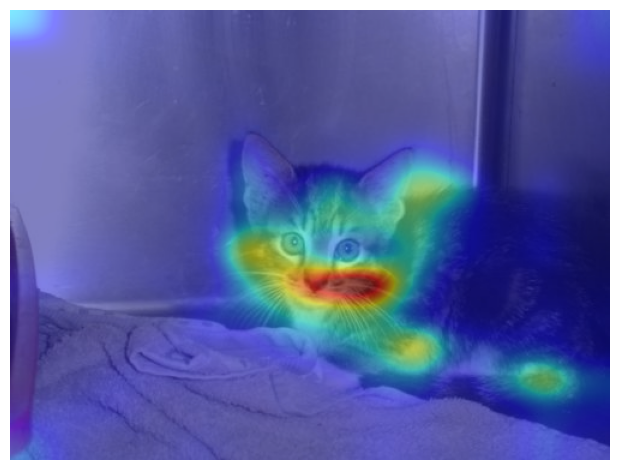

In [43]:
import matplotlib.pyplot as plt
from torchvision.transforms.v2.functional import to_pil_image
from torchcam.utils import overlay_mask

# Resize the CAM and overlay it
result = overlay_mask(to_pil_image(img), to_pil_image(activation_map[0].squeeze(0), mode='F'), alpha=0.5)
plt.imshow(result); plt.axis('off'); plt.tight_layout(); plt.show()

## 1) Calcluating the importance of each feature

In [5]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications.vgg16 import VGG16, preprocess_input

# --- Configuration ---
# The target layer for LayerCAM/Grad-CAM is usually the last convolutional layer.
# In VGG16, 'block5_conv3' is the final conv layer.
TARGET_LAYER_NAME = 'block5_conv3'

# Load the model
model = VGG16()

# Build a sub-model that outputs both the final prediction and the feature map
# from the target layer.
target_layer = model.get_layer(TARGET_LAYER_NAME)
cam_model = tf.keras.Model(inputs=model.input, outputs=[target_layer.output, model.output])

In [6]:
def calculate_channel_importance(processed_img, target_class_idx):
    """
    Calculates the importance score for each channel (filter) in the target layer
    using the magnitude of the gradient of the class score w.r.t the feature map.

    Args:
        processed_img (np.ndarray): The pre-processed image (1, 224, 224, 3).
        target_class_idx (int): The index of the class to explain (Y_c).

    Returns:
        np.ndarray: A 1D array of importance scores, one for each channel.
    """
    # Use tf.GradientTape to record operations for automatic differentiation
    with tf.GradientTape() as tape:
        # 1. Forward Pass: Get feature map and final predictions
        # The tape watches the feature map output for gradient calculation
        feature_map, predictions = cam_model(processed_img)

        # Make sure the feature map is watched by the tape for gradient calculation
        tape.watch(feature_map)

        # 2. Select the target class score (Y_c)
        target_score = predictions[:, target_class_idx]

    # 3. Backward Pass: Calculate the Gradient (The Attribution Step)
    # This is the core of LayerCAM/Grad-CAM: dY_c / d(Feature Map)
    gradients = tape.gradient(target_score, feature_map)

    # 4. LayerCAM Principle: Calculate Importance Weight (Alpha)
    # We take the gradient and apply ReLU (only positive contributions)
    guided_gradients = tf.cast(gradients > 0, 'float32') * gradients
    
    # 5. Calculate Channel Importance
    # The importance score (alpha) for each channel (k) is the MEAN spatial magnitude 
    # of the gradient. This measures how sensitive the output is to that channel.
    # Note: We take the absolute value before the mean to capture overall strength.
    channel_importance = tf.reduce_mean(tf.abs(guided_gradients), axis=(0, 1, 2))
    
    # Convert to numpy array for easier handling
    return channel_importance.numpy()

In [10]:
# Assuming TARGET_LAYER_NAME and cam_model are set up as before
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.vgg16 import VGG16, preprocess_input, decode_predictions

def get_top_prediction_index(processed_img):
    print(processed_img.shape)
    """
    Performs a forward pass and returns the index and class name of the
    model's most confident prediction.
    """
    # The cam_model returns (feature_map, predictions), we only need predictions
    _, predictions = cam_model(processed_img) 
    
    # Find the index with the maximum probability
    top_index = np.argmax(predictions[0])
    
    # Decode the top prediction to get the class name for display
    decoded_top_1 = decode_predictions(predictions.numpy(), top=1)[0][0]
    class_name = decoded_top_1[1]
    
    return top_index, class_name

# --- Example Usage Loop (Updated) ---
# NOTE: Using the same image_list structure as before, but 'target_class_idx' is now ignored.

# ... (Previous imports and setup code) ... 

image_list = [
    {'path': 'cat_front.jpg', 'target_class_idx': 285},  # 285 is 'tabby cat'
    {'path': 'cat_side.jpg', 'target_class_idx': 207},  # 207 is 'golden retriever'
    {'path': 'dog_front.jpg', 'target_class_idx': 751},       # 751 is 'race car'
    {'path': 'dog_side.jpg', 'target_class_idx': 207},  # 207 is 'golden retriever'
    {'path': 'car_volvo_xc60_suv_brown.jpg', 'target_class_idx': 751},       # 751 is 'race car'
]

all_importance_data = {}

base_path = "data/dog_cat_car/"

for img_info in image_list:
    # --- Load & Preprocess ---
    img_path = base_path+img_info['path']
    img = image.load_img(img_path, target_size=(224, 224))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    processed_img = preprocess_input(img_array)
    
    # *** NEW AUTOMATED STEP ***
    # 1. Get the index of the class the model is MOST confident about
    target_idx, target_name = get_top_prediction_index(processed_img)

    # --- Calculate Importance ---
    # 2. Pass the automatically found index to the importance function
    importance_scores = calculate_channel_importance(
        processed_img,
        target_idx
    )
    
    # --- Store and Display Results ---
    all_importance_data[img_path] = importance_scores
    
    # Identify Top 3 Channels
    top_3_indices = np.argsort(importance_scores)[::-1][:3]
    
    print(f"\nImage: {img_path}")
    print(f"Model Predicted Class: **{target_name}** (Index: {target_idx})")
    print(f"Top 3 Most Important Channels (Indices): {top_3_indices}")
    print(f"Scores: {[f'{importance_scores[i]:.4f}' for i in top_3_indices]}")

(1, 224, 224, 3)

Image: data/dog_cat_car/cat_front.jpg
Model Predicted Class: **Egyptian_cat** (Index: 285)
Top 3 Most Important Channels (Indices): [155 446 370]
Scores: ['0.0001', '0.0000', '0.0000']
(1, 224, 224, 3)

Image: data/dog_cat_car/cat_side.jpg
Model Predicted Class: **tabby** (Index: 281)
Top 3 Most Important Channels (Indices): [155 286  92]
Scores: ['0.0000', '0.0000', '0.0000']
(1, 224, 224, 3)

Image: data/dog_cat_car/dog_front.jpg
Model Predicted Class: **chow** (Index: 260)
Top 3 Most Important Channels (Indices): [155 403 141]
Scores: ['0.0000', '0.0000', '0.0000']
(1, 224, 224, 3)

Image: data/dog_cat_car/dog_side.jpg
Model Predicted Class: **kelpie** (Index: 227)
Top 3 Most Important Channels (Indices): [ 70 145 349]
Scores: ['0.0001', '0.0001', '0.0001']
(1, 224, 224, 3)

Image: data/dog_cat_car/car_volvo_xc60_suv_brown.jpg
Model Predicted Class: **minivan** (Index: 656)
Top 3 Most Important Channels (Indices): [496 216 155]
Scores: ['0.0001', '0.0001', '0.0001'

In [11]:
from tensorflow.keras.applications.vgg16 import decode_predictions
def get_top_prediction_index(processed_img):
    """
    Performs a forward pass and returns the index and class name of the
    model's most confident prediction.
    """
    # The cam_model returns (feature_map, predictions), we only need predictions
    _, predictions = cam_model(processed_img) 
    
    # Find the index with the maximum probability
    top_index = np.argmax(predictions[0])
    
    # Decode the top prediction to get the class name for display
    decoded_top_1 = decode_predictions(predictions.numpy(), top=1)[0][0]
    class_name = decoded_top_1[1]
    
    return top_index, class_name

In [12]:
import torch
import torch.nn.functional as F
import torchvision.transforms as transforms
from torchvision.models import vgg16, VGG16_Weights
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import cv2 # Still used for reliable image resizing and color mapping
from torchcam.methods import LayerCAM
from torchcam.utils import overlay_mask

# --- 1. Model and Layer Setup ---
# The target layers, one from each of the five convolutional blocks in VGG16
# In PyTorch VGG16, the blocks are named 'features.0' to 'features.30'.
# We choose the LAST CONVOLUTIONAL LAYER of each of the 5 main blocks.
TARGET_LAYER_NAMES = [
    'features.3',  # End of Block 1 (Conv2)
    'features.8',  # End of Block 2 (Conv2)
    'features.15', # End of Block 3 (Conv3)
    'features.22', # End of Block 4 (Conv3)
    'features.29'  # End of Block 5 (Conv3)
]

# Load the pre-trained VGG16 model from Torchvision
model = vgg16(weights=VGG16_Weights.IMAGENET1K_V1).eval() # Set model to evaluation mode



# --- 2. Utility Functions ---

def load_and_preprocess_image(img_path, target_size=(224, 224)):
    """Loads, resizes, and prepares an image for PyTorch VGG16."""
    img = Image.open(img_path).convert('RGB')
    
    # Define standard ImageNet preprocessing transforms
    preprocess = transforms.Compose([
        transforms.Resize(target_size),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ])
    
    # Apply preprocessing to create the input tensor
    input_tensor = preprocess(img).unsqueeze(0) # Add batch dimension
    
    # Convert PIL image to numpy array for plotting later
    img_np = np.array(img.resize(target_size))
    
    return input_tensor, img_np





def superimpose_heatmap(img_np, cam_mask):
    """Upsamples the mask and overlays it on the original image using OpenCV."""
    
    # cam_mask is a PyTorch tensor, detach and convert to numpy
    cam_mask_np = cam_mask[0].squeeze().cpu().numpy()
    
    # Resize the mask to the size of the image (224x224)
    resized_mask = cv2.resize(cam_mask_np, (img_np.shape[1], img_np.shape[0]))
    
    # Normalize mask to 0-255 and apply JET colormap
    heatmap = np.uint8(255 * resized_mask)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    
    # Overlay the heatmap (cv2 uses BGR, but we assume img_np is RGB)
    # Convert RGB to BGR for overlay, then back to RGB for matplotlib
    img_bgr = cv2.cvtColor(img_np.astype('uint8'), cv2.COLOR_RGB2BGR)
    superimposed_bgr = cv2.addWeighted(img_bgr, 0.6, heatmap, 0.4, 0)
    superimposed_img = cv2.cvtColor(superimposed_bgr, cv2.COLOR_BGR2RGB)
    
    return superimposed_img, resized_mask


# --- 3. Visualization Function ---

def visualize_layer_saliency_torchcam(image_data_list):
    
    num_cols = len(TARGET_LAYER_NAMES) + 2 # Original + 5 Blocks + Combined
    num_rows = len(image_data_list)
    
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 3 * num_rows))
    
    # Handle single row case
    if num_rows == 1:
        axes = [axes] 

    # --- Set Up Column Headers ---
    for c in range(num_cols):
        if c == 0:
            axes[0][c].set_title("Original Image", fontsize=10)
        elif c <= len(TARGET_LAYER_NAMES):
            axes[0][c].set_title(f"Block {c} CAM", fontsize=10)
        else:
            axes[0][c].set_title("Combined CAM", fontsize=10)

    # --- Process and Plot Each Image ---
    for r, img_info in enumerate(image_data_list):
        input_tensor, original_img_np = load_and_preprocess_image(img_info['path'])
        
        # 1. Get the model's prediction index
        # --- Load & Preprocess ---
        img_path2 = img_info['path']
        print(img_path2)
        img2 = image.load_img(img_path2, target_size=(224, 224))
        img_array2 = image.img_to_array(img2)
        img_array2 = np.expand_dims(img_array2, axis=0)
        processed_img2 = preprocess_input(img_array2)        
        target_idx, decoded_name = get_top_prediction_index(processed_img2)
        #print(xc, yc)

        # 2. Plot Original Image
        axes[r][0].imshow(original_img_np)
        axes[r][0].axis('off')
        
        # Array to store all 5 raw masks for the final combined map
        all_raw_masks = []
        
        # 3. Plot Layer-by-Layer Heatmaps using TorchCAM
        for c, layer_name in enumerate(TARGET_LAYER_NAMES):
            # Create a new LayerCAM extractor targeting the specific layer
            with LayerCAM(model, target_layer=layer_name) as cam_extractor:
                
                # Compute the final score for the predicted class
                scores = model(input_tensor)
                
                # Generate the CAM mask (this is the saliency map)
                cam_mask = cam_extractor(scores.squeeze(0).argmax().item(), scores)
                
                # Superimpose and store the raw mask for averaging
                superimposed, raw_mask = superimpose_heatmap(original_img_np, cam_mask)
                all_raw_masks.append(raw_mask)
            
                axes[r][c+1].imshow(superimposed)
                axes[r][c+1].axis('off')
        
        # 4. Plot Combined Heatmap (The last column)
        # Average the 5 raw masks and normalize the result
        combined_raw_mask = np.mean(np.array(all_raw_masks), axis=0)
        
        # Ensure the final average mask is normalized before superimposing
        if np.max(combined_raw_mask) > 0:
             combined_raw_mask = combined_raw_mask / np.max(combined_raw_mask)
        
        # The mask passed to superimpose_heatmap must be a tensor, so convert it back
        combined_mask_tensor = torch.from_numpy(combined_raw_mask).unsqueeze(0).unsqueeze(0).float()
        
        superimposed_combined, _ = superimpose_heatmap(original_img_np, combined_mask_tensor)
        
        axes[r][num_cols-1].imshow(superimposed_combined)
        axes[r][num_cols-1].axis('off')
        
        # Add row title
        axes[r][0].text(-10, 112, f"Target: {decoded_name}", ha='right', va='center', fontsize=12)

    plt.tight_layout()
    plt.show() # This should execute the final display command.
    
    # Trigger image suggestion for visualization
    # 




In [ ]:
# --- 4. Example Execution ---
# Note: You MUST provide a local file named 'imagenet_classes.txt' 
# or replace the paths with actual image file paths on your system.
base_path="data/dog_cat_car/"
images_for_analysis = [
    {'path': f'{base_path}cat_front.jpg'},
    {'path': f'{base_path}cat_side.jpg'},
    {'path': f'{base_path}dog_front.jpg'},
    {'path': f'{base_path}dog_side.jpg'},
    {'path': f'{base_path}car_volvo_xc60_suv_brown.jpg'},
]

visualize_layer_saliency_torchcam(images_for_analysis)

data/dog_cat_car/cat_side.jpg
data/dog_cat_car/cat_side_stocking.jpg
data/dog_cat_car/christmas_stocking.jpg
data/dog_cat_car/cat_side_dogbreed.jpg
data/dog_cat_car/dog_side_groenedale.jpg
data/dog_cat_car/dog_side.jpg
data/dog_cat_car/dog_australian_kelpie.jpg


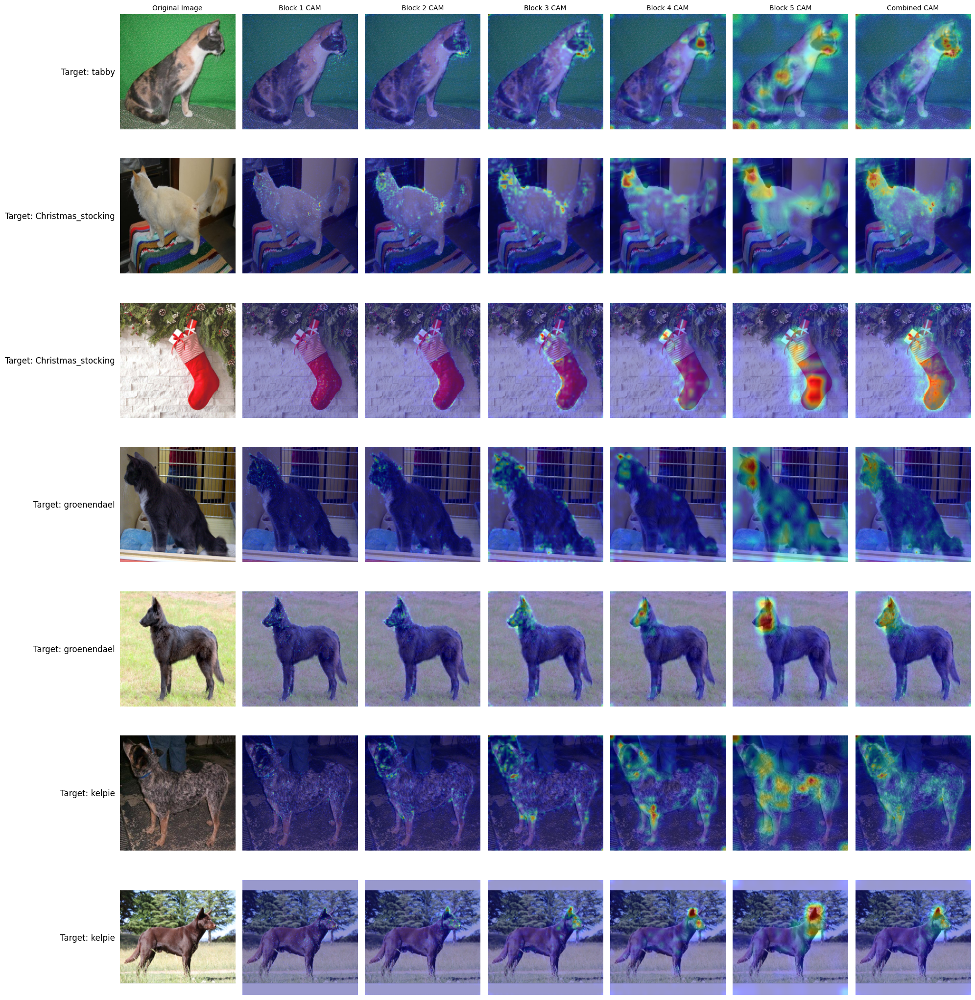

In [42]:
base_path="data/dog_cat_car/"
images_for_analysis = [
    {'path': f'{base_path}cat_side.jpg'},
    {'path': f'{base_path}cat_side_stocking.jpg'},
    {'path': f'{base_path}christmas_stocking.jpg'},
    {'path': f'{base_path}cat_side_dogbreed.jpg'},
    {'path': f'{base_path}dog_side_groenedale.jpg'},
    {'path': f'{base_path}dog_side.jpg'},
    {'path': f'{base_path}dog_australian_kelpie.jpg'},
]

visualize_layer_saliency_torchcam(images_for_analysis)

data/dog_cat_car/car_volvo_xc60_suv_brown.jpg
data/dog_cat_car/car_volvo_v60_stationwagon_blue.jpg
data/dog_cat_car/car_volvo_xc60_suv_gray.jpg
data/dog_cat_car/car_honda_odyssey_minivan.jpg


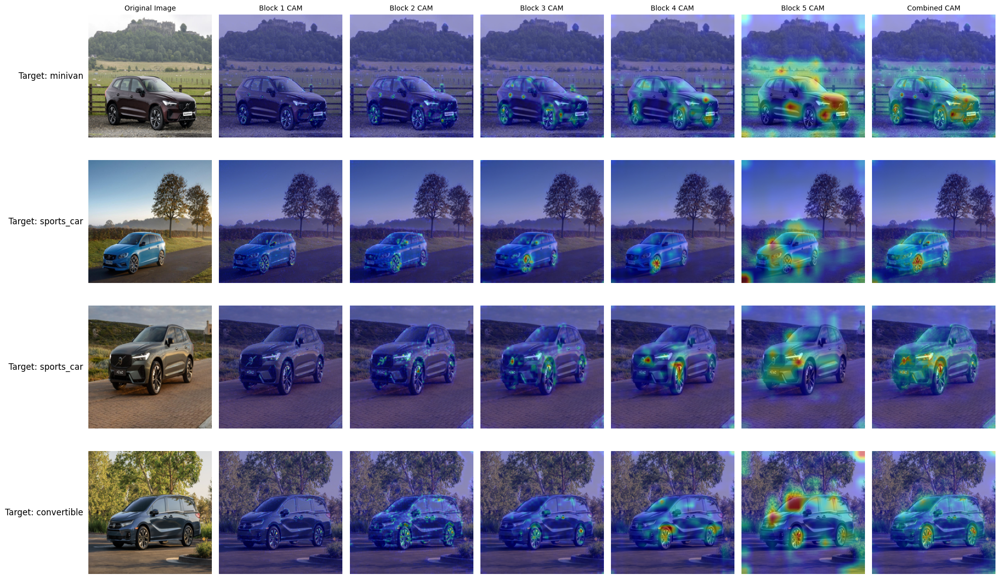

In [41]:
base_path="data/dog_cat_car/"
images_for_analysis = [
    {'path': f'{base_path}car_volvo_xc60_suv_brown.jpg'},
    {'path': f'{base_path}car_volvo_v60_stationwagon_blue.jpg'},
    {'path': f'{base_path}car_volvo_xc60_suv_gray.jpg'},
    {'path': f'{base_path}car_honda_odyssey_minivan.jpg'},
]

visualize_layer_saliency_torchcam(images_for_analysis)

data/dog_cat_car/car_volvo_xc60_suv_brown_cropped.jpg
data/dog_cat_car/car_volvo_v60_stationwagon_blue_cropped.jpg
data/dog_cat_car/car_volvo_xc60_suv_gray_cropped.jpg
data/dog_cat_car/car_honda_odyssey_minivan_cropped.jpg


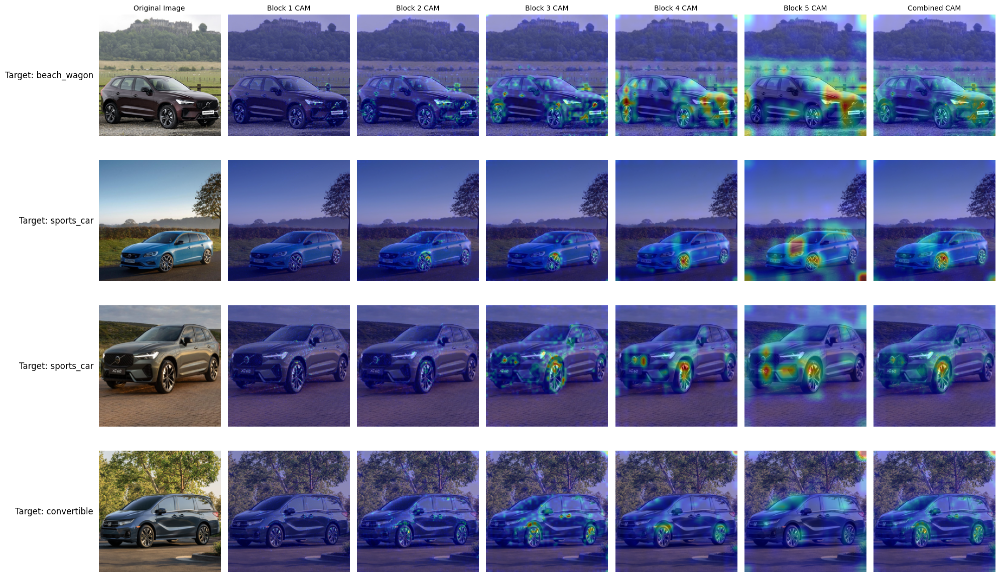

In [43]:
# CROPPED
base_path="data/dog_cat_car/"
images_for_analysis = [
    {'path': f'{base_path}car_volvo_xc60_suv_brown_cropped.jpg'},
    {'path': f'{base_path}car_volvo_v60_stationwagon_blue_cropped.jpg'},
    {'path': f'{base_path}car_volvo_xc60_suv_gray_cropped.jpg'},
    {'path': f'{base_path}car_honda_odyssey_minivan_cropped.jpg'},
]

visualize_layer_saliency_torchcam(images_for_analysis)

data/Image_486.jpg


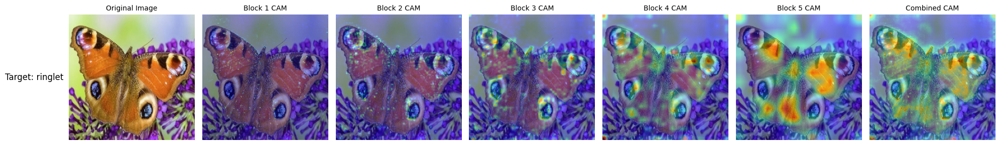

In [13]:
# CROPPED
base_path="data/"
images_for_analysis = [
    {'path': f'{base_path}Image_486.jpg'},
]

visualize_layer_saliency_torchcam(images_for_analysis)

## Generate Heatmap Series - Image Backdrop

In [37]:
import torch
import torch.nn.functional as F
import torchvision.transforms as transforms
from torchvision.models import vgg16, VGG16_Weights
from PIL import Image
import numpy as np
import cv2
import os
from torchcam.methods import LayerCAM

# --- 1. Model and Layer Setup ---
TARGET_LAYER_NAMES = [
    'features.3',  # Block 1
    'features.8',  # Block 2
    'features.15', # Block 3
    'features.22', # Block 4
    'features.29'  # Block 5
]

model = vgg16(weights=VGG16_Weights.IMAGENET1K_V1).eval()

# --- 2. Utility Functions ---

def load_and_preprocess_image(img_path, target_size=(224, 224)):
    img = Image.open(img_path).convert('RGB')
    preprocess = transforms.Compose([
        transforms.Resize(target_size),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ])
    input_tensor = preprocess(img).unsqueeze(0)
    img_np = np.array(img.resize(target_size))
    return input_tensor, img_np

def superimpose_heatmap(img_np, cam_mask):
    """Upsamples mask and overlays it. Returns BGR for direct cv2 saving."""
    cam_mask_np = cam_mask[0].squeeze().cpu().numpy()
    resized_mask = cv2.resize(cam_mask_np, (img_np.shape[1], img_np.shape[0]))
    
    # Normalize and color map
    heatmap = np.uint8(255 * resized_mask)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    
    # Convert original RGB to BGR for OpenCV processing
    img_bgr = cv2.cvtColor(img_np.astype('uint8'), cv2.COLOR_RGB2BGR)
    superimposed_bgr = cv2.addWeighted(img_bgr, 0.6, heatmap, 0.4, 0)
    
    return superimposed_bgr, resized_mask

# --- 3. Processing and Saving Function ---

def process_and_save_cams(image_data_list):
    for img_info in image_data_list:
        img_path = img_info['path']
        base_name = os.path.splitext(os.path.basename(img_path))[0]
        
        # Load and Preprocess
        input_tensor, original_img_np = load_and_preprocess_image(img_path)
        
        # 1. Save Original Image (Converted to BGR for cv2)
        orig_bgr = cv2.cvtColor(original_img_np, cv2.COLOR_RGB2BGR)
        cv2.imwrite(f"01.jpg", orig_bgr)
        print(f"Processing {base_name}...")

        all_raw_masks = []
        
        # 2. Generate and Save 5 Block CAMs
        for i, layer_name in enumerate(TARGET_LAYER_NAMES):
            with LayerCAM(model, target_layer=layer_name) as cam_extractor:
                scores = model(input_tensor)
                # Predict the class index
                pred_idx = scores.squeeze(0).argmax().item()
                
                # Generate mask
                cam_mask = cam_extractor(pred_idx, scores)
                superimposed_bgr, raw_mask = superimpose_heatmap(original_img_np, cam_mask)
                
                all_raw_masks.append(raw_mask)
                
                # Save Block CAM
                cv2.imwrite(f"0{i+2}.jpg", superimposed_bgr)

        # 3. Generate and Save Combined CAM
        combined_raw_mask = np.mean(np.array(all_raw_masks), axis=0)
        if np.max(combined_raw_mask) > 0:
            combined_raw_mask = combined_raw_mask / np.max(combined_raw_mask)
        
        # Convert back to tensor format for the utility function
        combined_mask_tensor = torch.from_numpy(combined_raw_mask).unsqueeze(0).unsqueeze(0).float()
        combined_bgr, _ = superimpose_heatmap(original_img_np, combined_mask_tensor)
        
        cv2.imwrite(f"07.jpg", combined_bgr)
        
        print(f"Done! Saved 7 images for {base_name}.")

# --- Example Usage ---
if __name__ == "__main__":
    # Add your image paths here
    images_to_process = [
        {'path': 'data/streamlit/daisy_985.jpg'}, 
    ]
    process_and_save_cams(images_to_process)

Processing daisy_985...
Done! Saved 7 images for daisy_985.


## Generate Heatmap Series - Black Backdrop

In [38]:
import torch
import torchvision.transforms as transforms
from torchvision.models import vgg16, VGG16_Weights
from PIL import Image
import numpy as np
import cv2
import os
from torchcam.methods import LayerCAM

# --- Configuration ---
# The threshold below which activations are turned black.
# Range 0.0 to 1.0. Higher = more blue/purple removed. Try 0.3 to 0.5.
THRESHOLD = 0.15

TARGET_LAYER_NAMES = [
    'features.3',  # Block 1
    'features.8',  # Block 2
    'features.15', # Block 3
    'features.22', # Block 4
    'features.29'  # Block 5
]

# --- 1. Model Setup ---
model = vgg16(weights=VGG16_Weights.IMAGENET1K_V1).eval()

# --- 2. Utility Functions ---

def load_and_preprocess_image(img_path, target_size=(224, 224)):
    img = Image.open(img_path).convert('RGB')
    preprocess = transforms.Compose([
        transforms.Resize(target_size),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ])
    input_tensor = preprocess(img).unsqueeze(0)
    img_np = np.array(img.resize(target_size))
    return input_tensor, img_np

def create_black_bg_heatmap(img_shape, cam_mask, threshold=THRESHOLD):
    """
    Creates a heatmap on a black background, ignoring weak activations.
    Returns BGR image for direct cv2 saving, and the raw resized mask.
    """
    # cam_mask is a PyTorch tensor, detach and convert to numpy (values 0.0 to 1.0)
    cam_mask_np = cam_mask[0].squeeze().cpu().numpy()
    
    # Resize the mask to the size of the original image
    height, width = img_shape[:2]
    resized_mask = cv2.resize(cam_mask_np, (width, height))
    
    # --- Thresholding and Masking ---
    # 1. Create a copy for thresholding
    thresholded_mask = resized_mask.copy()
    # 2. Set weak activations to absolute 0.0
    thresholded_mask[thresholded_mask < threshold] = 0.0
    
    # 3. Normalize to 0-255 uint8 for coloring
    heatmap_uint8 = np.uint8(255 * thresholded_mask)
    
    # 4. Apply JET colormap. 
    # NOTE: By default, JET turns 0 into bright Blue. We want Black.
    heatmap_colored_bgr = cv2.applyColorMap(heatmap_uint8, cv2.COLORMAP_JET)
    
    # 5. Create a binary mask to turn the background black.
    # Create a mask where 1 = keep color, 0 = make black
    binary_mask = (thresholded_mask > 0).astype(np.uint8)
    # Make it 3 channels so we can multiply it with the BGR image
    binary_mask_3ch = cv2.merge([binary_mask, binary_mask, binary_mask])
    
    # 6. Apply mask: Multiply colored heatmap by the binary mask.
    # Areas where mask is 0 become black (0,0,0).
    final_heatmap_bgr = heatmap_colored_bgr * binary_mask_3ch
    
    return final_heatmap_bgr.astype(np.uint8), resized_mask

# --- 3. Processing and Saving Function ---

def process_and_save_cams(image_data_list):
    for img_info in image_data_list:
        img_path = img_info['path']
        base_name = os.path.splitext(os.path.basename(img_path))[0]
        
        print(f"Processing {base_name}...")
        
        # Load and Preprocess
        input_tensor, original_img_np = load_and_preprocess_image(img_path)
        img_shape = original_img_np.shape
        
        # 1. Save Original Image (Converted to BGR for cv2)
        orig_bgr = cv2.cvtColor(original_img_np, cv2.COLOR_RGB2BGR)
        cv2.imwrite(f"01.jpg", orig_bgr)
        
        all_raw_masks = []
        
        # 2. Generate and Save 5 Block CAMs
        for i, layer_name in enumerate(TARGET_LAYER_NAMES):
            with LayerCAM(model, target_layer=layer_name) as cam_extractor:
                scores = model(input_tensor)
                pred_idx = scores.squeeze(0).argmax().item()
                
                # Generate mask
                cam_mask = cam_extractor(pred_idx, scores)
                
                # Create black background heatmap
                heatmap_bgr, raw_mask = create_black_bg_heatmap(img_shape, cam_mask)
                
                all_raw_masks.append(raw_mask)
                
                # Save Block CAM
                cv2.imwrite(f"0{i+2}.jpg", heatmap_bgr)

        # 3. Generate and Save Combined CAM
        combined_raw_mask = np.mean(np.array(all_raw_masks), axis=0)
        # Normalize combined mask again after averaging
        if np.max(combined_raw_mask) > 0:
            combined_raw_mask = combined_raw_mask / np.max(combined_raw_mask)
        
        # Convert back to tensor format for the utility function
        combined_mask_tensor = torch.from_numpy(combined_raw_mask).unsqueeze(0).unsqueeze(0).float()
        
        combined_heatmap_bgr, _ = create_black_bg_heatmap(img_shape, combined_mask_tensor)
        
        cv2.imwrite(f"0{7}.jpg", combined_heatmap_bgr)
        
        print(f"Done! Saved 7 images for {base_name}.")

# --- Example Usage ---
if __name__ == "__main__":
    # Add your image paths here
    images_to_process = [
        {'path': 'data/streamlit/daisy_985.jpg'}, 
        # {'path': 'another_image.jpg'},
    ]
    
    # Ensure the example image exists or comment it out
    if os.path.exists(images_to_process[0]['path']):
        process_and_save_cams(images_to_process)
    else:
        print("Please ensure 'butterfly.jpg' exists or update the 'images_to_process' list.")

Processing daisy_985...
Done! Saved 7 images for daisy_985.
